In [1]:
import pandas as pd
import numpy as np 
import seaborn as sns
import pickle
import matplotlib.pyplot as plt
creditcard_df = pd.read_csv("creditcard.csv")

**DATA EXPLORATION**

array([[<AxesSubplot: title={'center': 'Time'}>,
        <AxesSubplot: title={'center': 'V1'}>,
        <AxesSubplot: title={'center': 'V2'}>,
        <AxesSubplot: title={'center': 'V3'}>,
        <AxesSubplot: title={'center': 'V4'}>,
        <AxesSubplot: title={'center': 'V5'}>],
       [<AxesSubplot: title={'center': 'V6'}>,
        <AxesSubplot: title={'center': 'V7'}>,
        <AxesSubplot: title={'center': 'V8'}>,
        <AxesSubplot: title={'center': 'V9'}>,
        <AxesSubplot: title={'center': 'V10'}>,
        <AxesSubplot: title={'center': 'V11'}>],
       [<AxesSubplot: title={'center': 'V12'}>,
        <AxesSubplot: title={'center': 'V13'}>,
        <AxesSubplot: title={'center': 'V14'}>,
        <AxesSubplot: title={'center': 'V15'}>,
        <AxesSubplot: title={'center': 'V16'}>,
        <AxesSubplot: title={'center': 'V17'}>],
       [<AxesSubplot: title={'center': 'V18'}>,
        <AxesSubplot: title={'center': 'V19'}>,
        <AxesSubplot: title={'center': 'V20'}

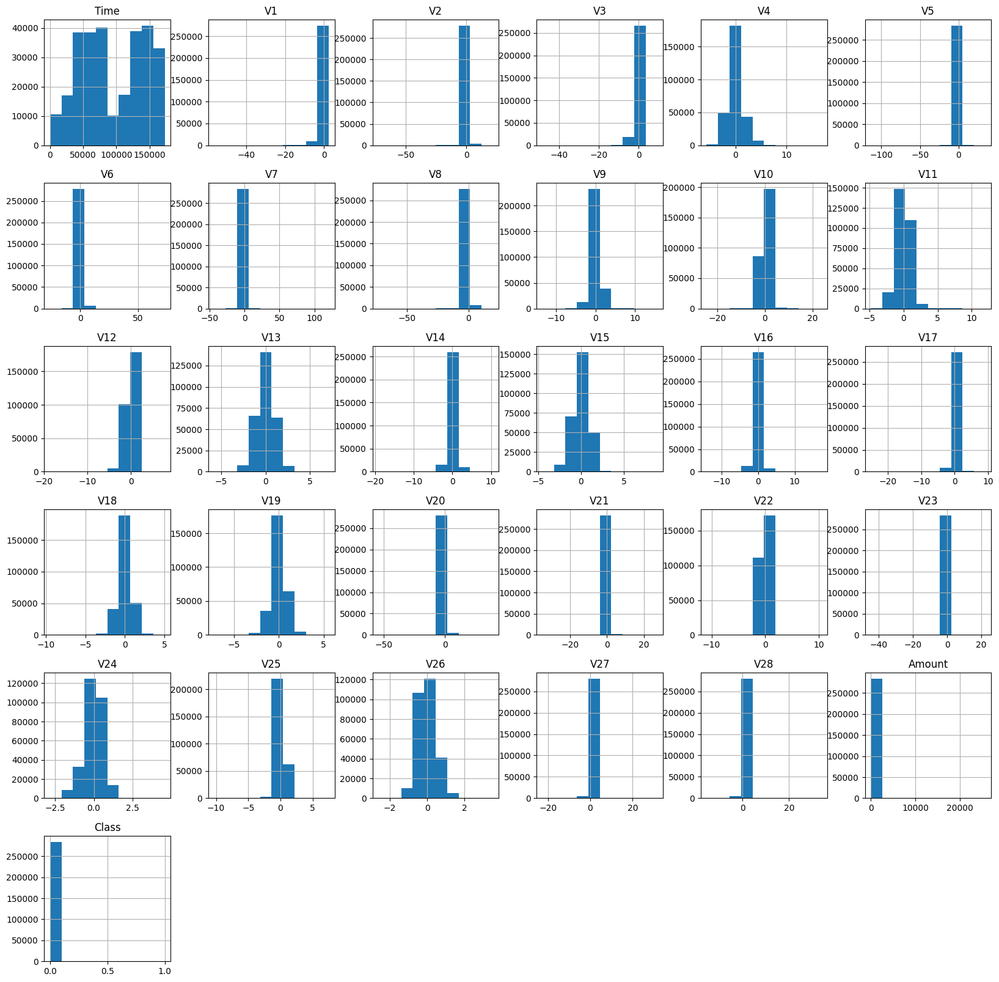

In [2]:
creditcard_df.hist(figsize=(20,20))

<AxesSubplot: >

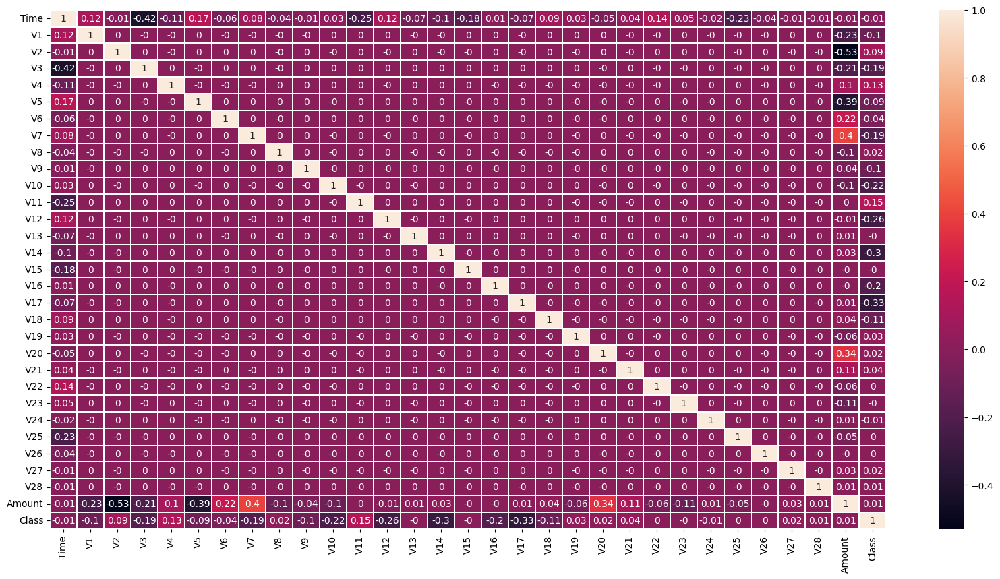

In [3]:
#create a correlation matrix using seaborn
corr_matrix = creditcard_df.corr()
plot,ax = plt.subplots(figsize=(20,10))
sns.heatmap(corr_matrix.round(2),linewidths=0.2,annot=True)

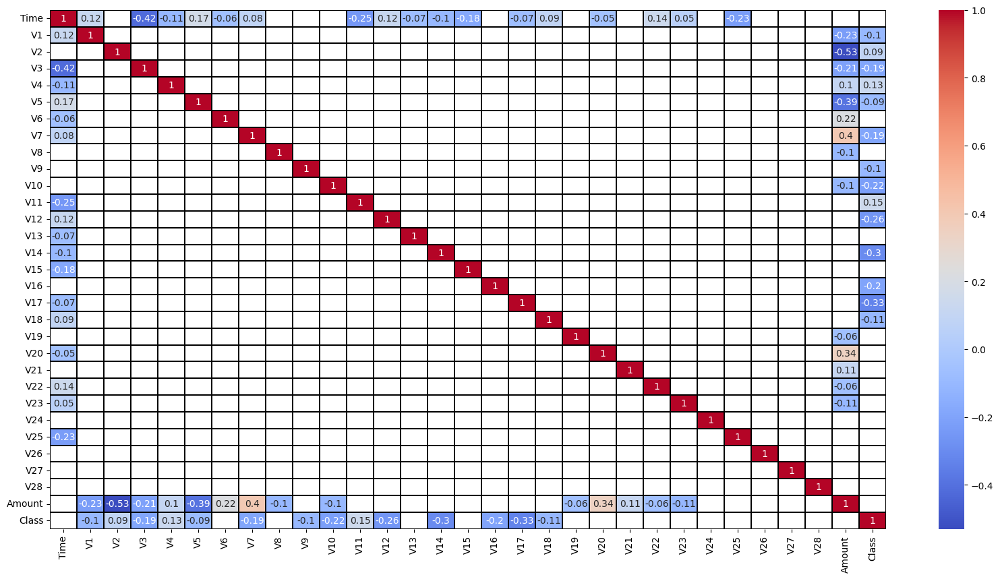

In [4]:
#make a heatmap of values only where correlation is less than -0.2 or greater than 0.2
corr_matrix = creditcard_df.corr()
plot,ax = plt.subplots(figsize=(20,10))
sns.heatmap(corr_matrix[(corr_matrix >= 0.05) | (corr_matrix <= -0.05)].round(2),linewidths=0.3,annot=True,cmap='coolwarm',cbar=True,linecolor='black')
plt.show()

In [2]:
#number of 0s and 1s in class column
creditcard_df['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

In [11]:
# sns.pairplot(creditcard_df.sample(frac=0.01))

**DATASET PREPROCESSING**

In [2]:
from sklearn.preprocessing import StandardScaler

Scaling the values


In [3]:
scaler = StandardScaler()
rescaled_data= scaler.fit_transform(creditcard_df.iloc[:,1:30])
rescaled_df = pd.DataFrame(rescaled_data,columns=creditcard_df.iloc[:,1:30].columns)

**DATA ANALYTICS USING SVM**

In [4]:
from sklearn import svm
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,roc_auc_score,roc_curve,auc,confusion_matrix,precision_recall_curve,precision_score,recall_score
rescaled_df
y = creditcard_df['Class']

***RandomizedSearchCV for Linear Kernel***

In [5]:
#train_test split
X_train,X_test,y_train,y_test = train_test_split(rescaled_df,y,test_size=0.3,random_state=42,stratify=y)
#printing the shape of X and y after splitting
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(199364, 29)
(85443, 29)
(199364,)
(85443,)


In [9]:
#run a normal SVM
svm_model = svm.SVC(probability=True,kernel='linear')
params_grid={'C':[0.0001,0.001,0.01,0.1,0.2]}

In [ ]:
#randomized search
linear_random_search = RandomizedSearchCV(svm_model,params_grid,scoring='roc_auc',cv=5,verbose=2)
linear_random_search.fit(X_train,y_train)
with open('/content/drive/My Drive/randomsearchLINEARsvm.sav', 'wb') as model_file:
    pickle.dump(linear_random_search, model_file)
#RAN ON GOOGLE COLAB AND SAVED THE MODEL SINCE IT WAS TAKING TIME

In [7]:
svm_linear=pickle.load(open('randomsearchLINEARsvm.sav','rb'))
svm_linear.best_estimator_.get_params()
svm_linear = svm_linear.best_estimator_

In [8]:
y_pred=svm_linear.predict(X_test)
# y_pred_prob=svm_linear.best_estimator_.predict_proba(X_test)[:,1]
print("Accuracy:",accuracy_score(y_test, y_pred))
print("ROC_AUC:",roc_auc_score(y_test,y_pred))
print("Precision:",precision_score(y_test,y_pred))
print("Recall:",recall_score(y_test,y_pred))

Accuracy: 0.9992509626300574
ROC_AUC: 0.8815867585153593
Precision: 0.795774647887324
Recall: 0.7635135135135135


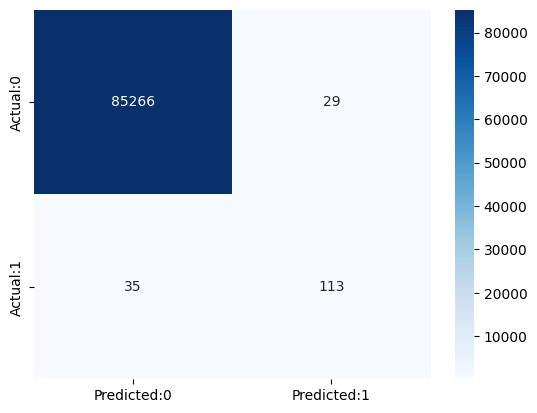

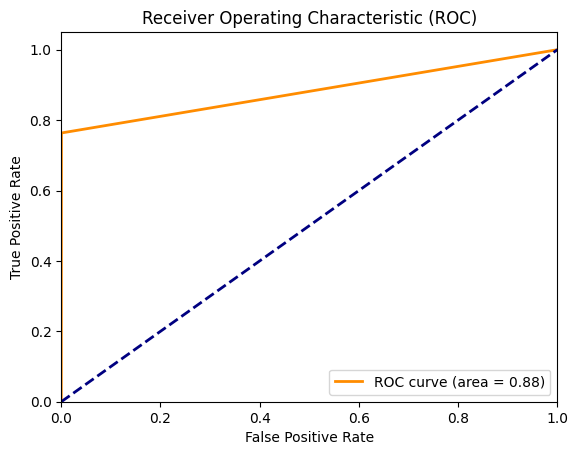

In [9]:

#plot the heatmap with labels
confusionlabeled_matrix = pd.DataFrame(data=confusion_matrix(y_test,y_pred), index=['Actual:0','Actual:1'],columns=['Predicted:0','Predicted:1'])
sns.heatmap(confusionlabeled_matrix,annot=True,fmt='d',cmap='Blues')
confusionlabeled_matrix

fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

**RANDOMIZED SEARCH CV FOR SVM WITH RBF KERNEL**

In [9]:
#train_test split
X_train,X_test,y_train,y_test = train_test_split(rescaled_df,y,test_size=0.3,random_state=42,stratify=y)
#printing the shape of X and y after splitting
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(199364, 29)
(85443, 29)
(199364,)
(85443,)


In [89]:
params_grid ={'gamma':[0.1,0.2,0.3,0.4,0.5],
              'C':[0.0001,0.001,0.01]
              }
svm_with_rbf_kernel= svm.SVC(kernel='rbf')
svm_cv = RandomizedSearchCV(svm_with_rbf_kernel,params_grid,cv=5,verbose=2)

In [ ]:
svm_cv.fit(X_train,y_train)
with open('/content/drive/My Drive/randomsearchRBFsvm.sav', 'wb') as model_file:
    pickle.dump(svm_cv, model_file)
    #RAN ON GOOGLE COLAB AND SAVED MODEL DUE TO HARDWARD RESTRICTIONS

In [10]:
svm_rbf_model = pickle.load(open('randomsearchRBFsvm.sav','rb'))
svm_rbf_model = svm_rbf_model.best_estimator_

In [11]:
y_pred=svm_rbf_model.predict(X_test)
accuracy= accuracy_score(y_test, y_pred)
print("Accuracy:",accuracy*100,"%")
print('roc=',roc_auc_score(y_test,y_pred))
print('precision=',precision_score(y_test,y_pred))
print('recall=',recall_score(y_test,y_pred))

Accuracy: 99.8267851082008 %
roc= 0.5
precision= 0.0
recall= 0.0


c:\Users\HP\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


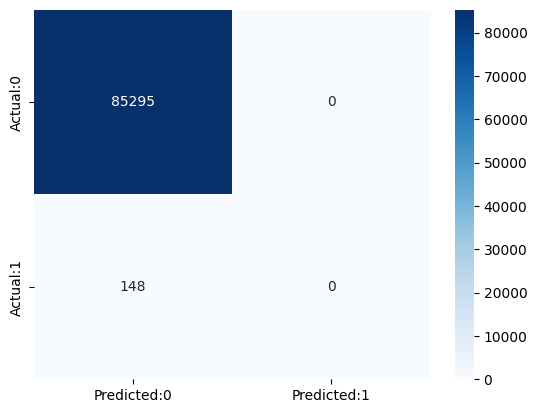

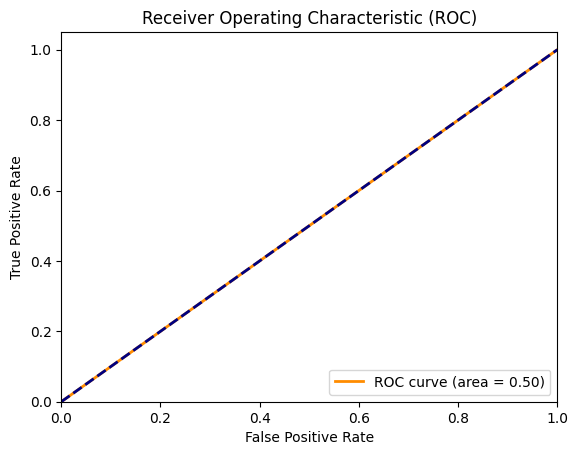

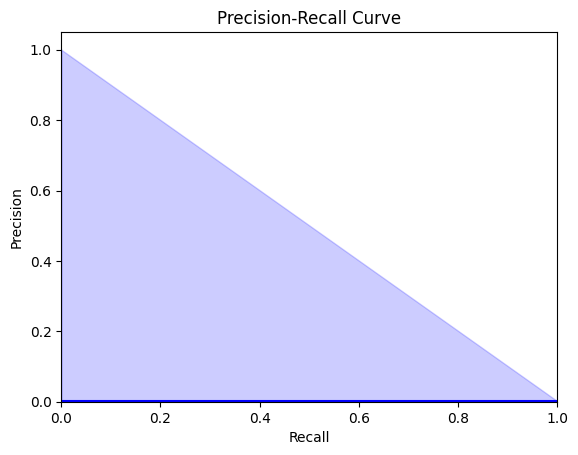

In [12]:
#import seaborn library to visualize the heatmap
#plot the heatmap with labels
confusionlabeled_matrix = pd.DataFrame(data=confusion_matrix(y_test,y_pred), index=['Actual:0','Actual:1'],columns=['Predicted:0','Predicted:1'])
sns.heatmap(confusionlabeled_matrix,annot=True,fmt='d',cmap='Blues')
confusionlabeled_matrix
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

precision, recall, _ = precision_recall_curve(y_test, y_pred)

plt.figure()
plt.step(recall, precision, color='b', where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.show()

**RANDOMIZED SVM SEARCH FOR POLYNOMIAL KERNEL**

In [13]:
#train_test split
X_train,X_test,y_train,y_test = train_test_split(rescaled_df,y,test_size=0.3,random_state=42,stratify=y)
#printing the shape of X and y after splitting
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


(199364, 29)
(85443, 29)
(199364,)
(85443,)


In [74]:
params_grid ={'gamma':[0.1,0.2,0.3,0.4,0.5],
              'C':[0.0001,0.001,0.01,0.1,0.2,0.3,0.4,0.5]
              }
svm_with_polynomial_kernel= svm.SVC(kernel='poly')
svm_cv_poly = RandomizedSearchCV(svm_with_polynomial_kernel,params_grid,cv=5,verbose=2, scoring='roc_auc')

In [ ]:
svm_cv_poly.fit(X_test,y_test)

In [16]:
poly_svm = pickle.load(open('randomsearchPOLYsvm.sav','rb'))
poly_svm = poly_svm.best_estimator_

In [17]:
y_pred=poly_svm.predict(X_test)
accuracy= accuracy_score(y_test, y_pred)
print("Accuracy:",accuracy*100,"%")
print('roc=',roc_auc_score(y_test,y_pred))
print('precision=',precision_score(y_test,y_pred))
print('recall=',recall_score(y_test,y_pred))


Accuracy: 99.92743700478681 %
roc= 0.8242657042410838
precision= 0.9056603773584906
recall= 0.6486486486486487


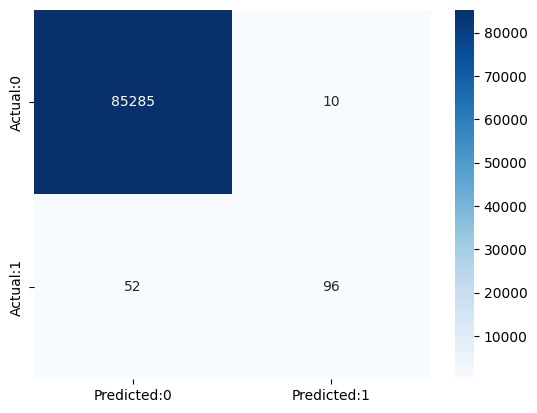

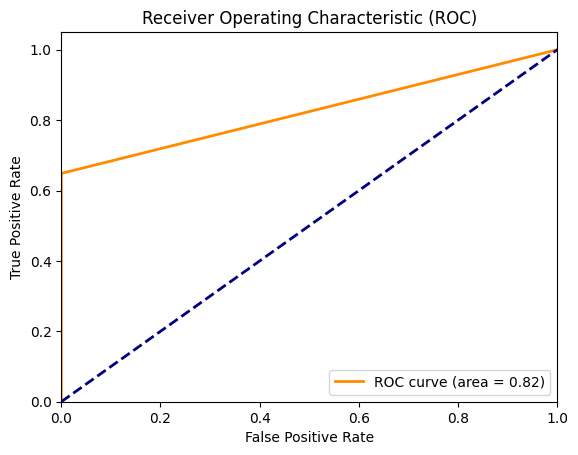

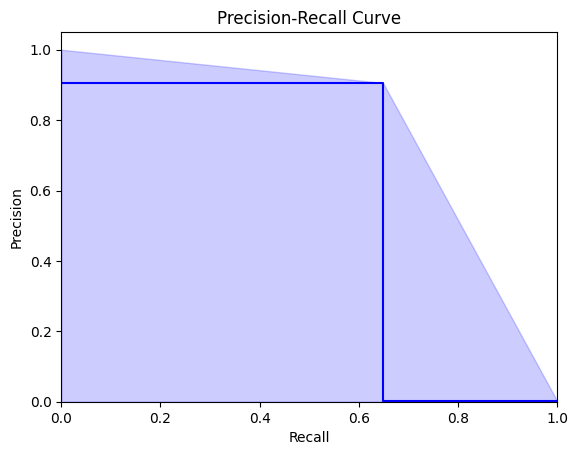

In [18]:
#import seaborn library to visualize the heatmap
#plot the heatmap with labels
confusionlabeled_matrix = pd.DataFrame(data=confusion_matrix(y_test,y_pred), index=['Actual:0','Actual:1'],columns=['Predicted:0','Predicted:1'])
sns.heatmap(confusionlabeled_matrix,annot=True,fmt='d',cmap='Blues')
confusionlabeled_matrix
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

precision, recall, _ = precision_recall_curve(y_test, y_pred)

plt.figure()
plt.step(recall, precision, color='b', where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.show()

**DATA ANALYTICS USING DECISION TREE**

In [19]:
from sklearn.tree import DecisionTreeClassifier

In [20]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(rescaled_df, y, test_size=0.3, stratify=y)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)


(199364, 29)
(85443, 29)
(199364,)
(85443,)


In [68]:
params_grid ={ 'criterion':['gini','entropy','log_loss'],
                'splitter':['best','random'],
}
treeclf = DecisionTreeClassifier(random_state=42)
tree_cv_clf = RandomizedSearchCV(treeclf,params_grid,cv=5,verbose=2,scoring='roc_auc')

In [69]:
tree_cv_clf.fit(X_test,y_test)
with open('randomsearchTREE.sav', 'wb') as model_file:
    pickle.dump(tree_cv_clf, model_file)

c:\Users\HP\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning: The total space of parameters 6 is smaller than n_iter=10. Running 6 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV] END ......................criterion=gini, splitter=best; total time=   8.9s
[CV] END ......................criterion=gini, splitter=best; total time=   8.9s
[CV] END ......................criterion=gini, splitter=best; total time=  13.0s
[CV] END ......................criterion=gini, splitter=best; total time=   9.9s
[CV] END ......................criterion=gini, splitter=best; total time=   9.9s
[CV] END ....................criterion=gini, splitter=random; total time=   0.1s
[CV] END ....................criterion=gini, splitter=random; total time=   0.2s
[CV] END ....................criterion=gini, splitter=random; total time=   0.1s
[CV] END ....................criterion=gini, splitter=random; total time=   0.2s
[CV] END ....................criterion=gini, splitter=random; total time=   0.2s
[CV] END ...................criterion=entropy, splitter=best; total time=   7.1s
[CV] END ...................criterion=entropy, sp

In [21]:
tree_clf = pickle.load(open('randomsearchTREE.sav','rb'))
tree_clf.cv_results_
tree_clf=tree_clf.best_estimator_

In [22]:
# Predict the values for the testing data
y_pred = tree_clf.predict(X_test)

# Evaluate the performance of the classifier using metrics such as accuracy, precision, recall, and F1-score
print("Accuracy:", accuracy_score(y_test, y_pred))
print("ROC=",roc_auc_score(y_test,y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))

Accuracy: 0.999204147794436
ROC= 0.8883083432221717
Precision: 0.7666666666666667
Recall: 0.777027027027027


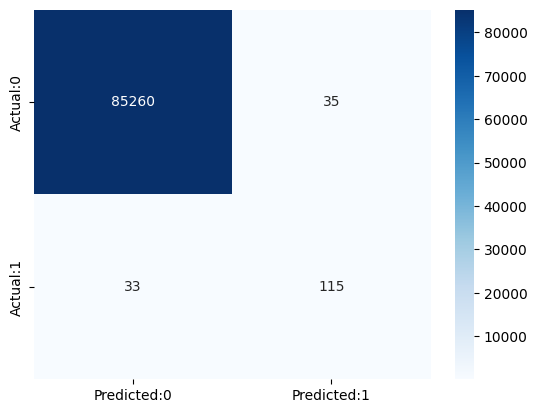

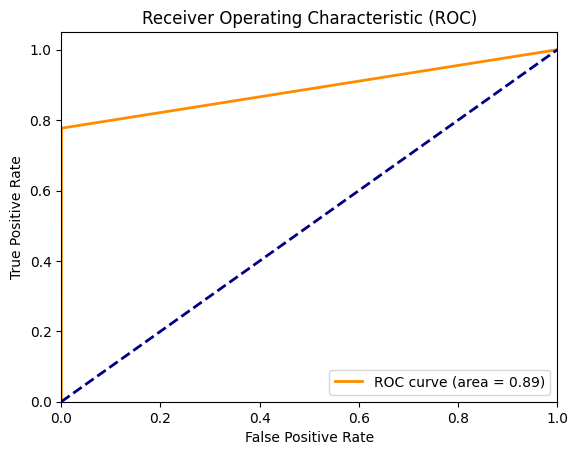

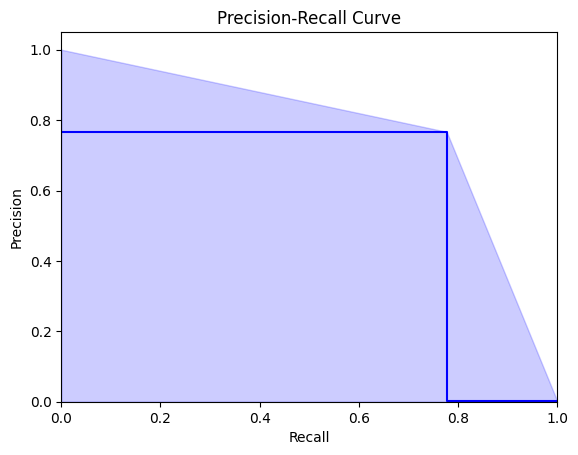

In [23]:
#import seaborn library to visualize the heatmap
#plot the heatmap with labels
confusionlabeled_matrix = pd.DataFrame(data=confusion_matrix(y_test,y_pred), index=['Actual:0','Actual:1'],columns=['Predicted:0','Predicted:1'])
sns.heatmap(confusionlabeled_matrix,annot=True,fmt='d',cmap='Blues')
confusionlabeled_matrix
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

precision, recall, _ = precision_recall_curve(y_test, y_pred)

plt.figure()
plt.step(recall, precision, color='b', where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.show()

**RANDOM FOREST CLASSIFIER**

In [24]:
from sklearn.ensemble import RandomForestClassifier

In [40]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(rescaled_df, y, test_size=0.3,  random_state=42, stratify=y)
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(199364, 29)
(85443, 29)
(199364,)
(85443,)


In [26]:
randomforestclf = RandomForestClassifier(n_jobs=-1,random_state=42)

In [27]:
#randomized search cv for randomforest
params_grid ={'n_estimators':[100,200],
              'criterion':['gini','entropy']
              }
randomforest_cv_clf = RandomizedSearchCV(randomforestclf,params_grid,cv=5,verbose=2,scoring='roc_auc')
randomforest_cv_clf.fit(X_train,y_train)

c:\Users\HP\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\model_selection\_search.py:307: UserWarning: The total space of parameters 4 is smaller than n_iter=10. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Fitting 5 folds for each of 4 candidates, totalling 20 fits
[CV] END ...................criterion=gini, n_estimators=100; total time= 2.6min
[CV] END ...................criterion=gini, n_estimators=100; total time= 2.3min
[CV] END ...................criterion=gini, n_estimators=100; total time= 2.5min
[CV] END ...................criterion=gini, n_estimators=100; total time= 2.4min
[CV] END ...................criterion=gini, n_estimators=100; total time= 2.1min
[CV] END ...................criterion=gini, n_estimators=200; total time= 5.7min
[CV] END ...................criterion=gini, n_estimators=200; total time= 5.1min
[CV] END ...................criterion=gini, n_estimators=200; total time= 4.5min
[CV] END ...................criterion=gini, n_estimators=200; total time= 4.3min
[CV] END ...................criterion=gini, n_estimators=200; total time= 6.1min
[CV] END ................criterion=entropy, n_estimators=100; total time= 1.4min
[CV] END ................criterion=entropy, n_est

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(n_jobs=-1, random_state=42),
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'n_estimators': [100, 200]},
                   scoring='roc_auc', verbose=2)

In [31]:
pickle.dump(randomforest_cv_clf,open('randomforestRScv.sav','wb'))

In [32]:
randomforestclf=pickle.load(open('randomforestRScv.sav','rb'))

In [41]:
# Predict the values for the testing data
y_pred = randomforestclf.best_estimator_.predict(X_test)

# Evaluate the performance of the classifier using metrics such as accuracy, precision, recall, and F1-score
print("Accuracy:", accuracy_score(y_test, y_pred))
print("ROC=",roc_auc_score(y_test,y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))

Accuracy: 0.9995435553526912
ROC= 0.8783607923534063
Precision: 0.9739130434782609
Recall: 0.7567567567567568


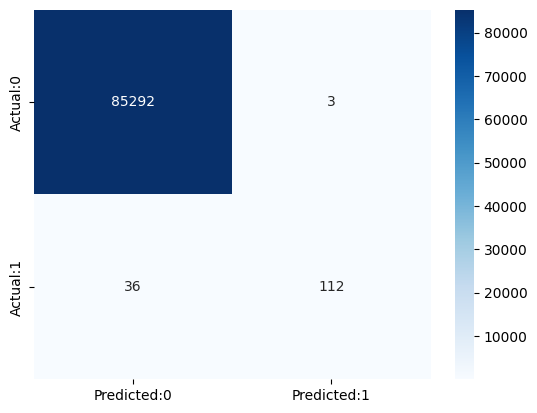

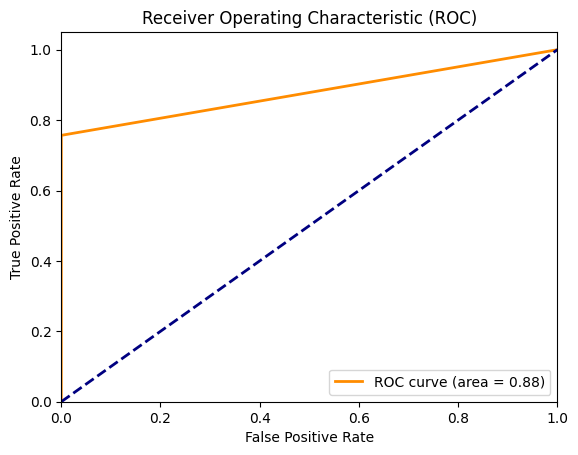

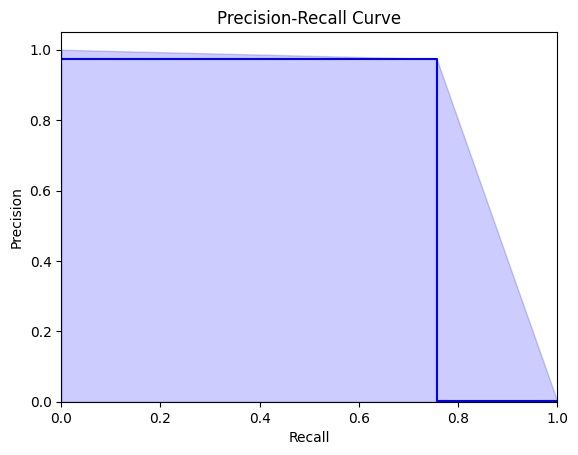

In [42]:
#import seaborn library to visualize the heatmap
#plot the heatmap with labels
confusionlabeled_matrix = pd.DataFrame(data=confusion_matrix(y_test,y_pred), index=['Actual:0','Actual:1'],columns=['Predicted:0','Predicted:1'])
sns.heatmap(confusionlabeled_matrix,annot=True,fmt='d',cmap='Blues')
confusionlabeled_matrix
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

precision, recall, _ = precision_recall_curve(y_test, y_pred)

plt.figure()
plt.step(recall, precision, color='b', where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.show()

**NAIVE BAYES CLASSIFICATION**

In [10]:
from sklearn.naive_bayes import GaussianNB

In [11]:
X_train, X_test, y_train, y_test = train_test_split(rescaled_df, y, test_size=0.3,  random_state=42, stratify=y)

In [12]:
bayes_clf = GaussianNB()
bayes_clf.fit(X_train,y_train)

GaussianNB()

In [44]:
pickle.dump(bayes_clf,open('naivebayesclf.sav','wb'))

In [16]:
y_pred = bayes_clf.predict(X_test)
print('accuracy =',accuracy_score(y_test,y_pred=y_pred))
print('roc=',roc_auc_score(y_test,y_pred))
print('precision=',precision_score(y_test,y_pred))
print('recall=',recall_score(y_test,y_pred))

accuracy = 0.9779268050045059
roc= 0.8911412775692628
precision= 0.06022267206477733
recall= 0.8040540540540541


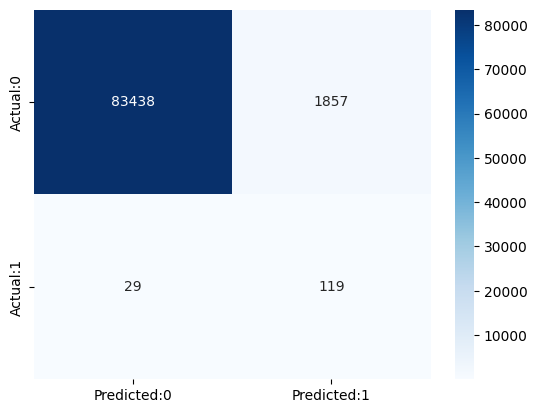

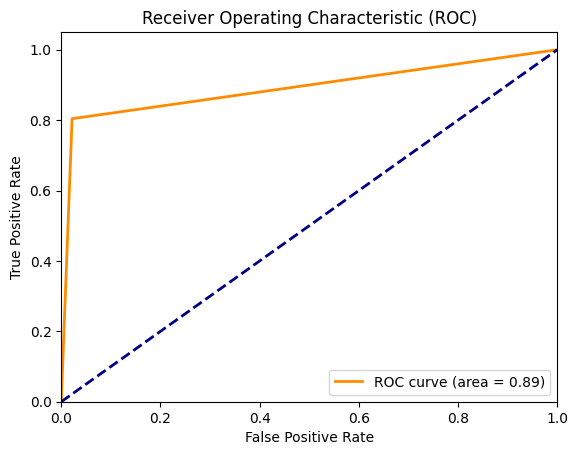

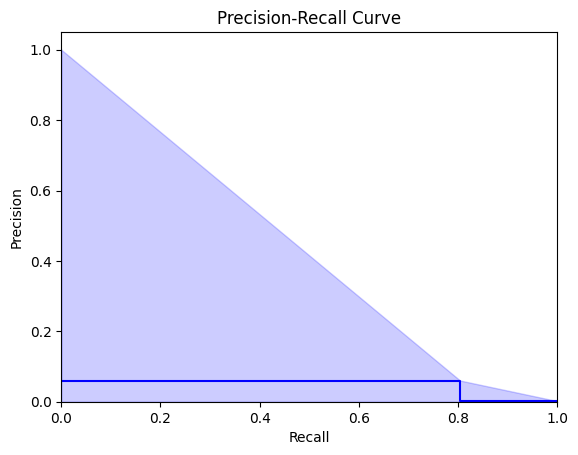

In [15]:
confusionlabeled_matrix = pd.DataFrame(data=confusion_matrix(y_test,y_pred), index=['Actual:0','Actual:1'],columns=['Predicted:0','Predicted:1'])
sns.heatmap(confusionlabeled_matrix,annot=True,fmt='d',cmap='Blues')
confusionlabeled_matrix
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

precision, recall, _ = precision_recall_curve(y_test, y_pred)

plt.figure()
plt.step(recall, precision, color='b', where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.show()

**STOCHASTIC GRADIENT**

In [20]:
from sklearn.linear_model import SGDClassifier

In [40]:
X_train, X_test, y_train, y_test = train_test_split(rescaled_df, y, test_size=0.3, stratify=y)

In [23]:
clf = SGDClassifier()
clf.fit(X_train, y_train)

SGDClassifier()

In [36]:
y_pred = clf.predict(X_test)
print('accuracy =',accuracy_score(y_test,y_pred=y_pred))
print('roc=',roc_auc_score(y_test,y_pred))
print('precision=',precision_score(y_test,y_pred))
print('recall=',recall_score(y_test,y_pred))

accuracy = 0.9990285921608558
roc= 0.7668098237753552
precision= 0.8494623655913979
recall= 0.5337837837837838


In [25]:
#Randomizedsearch
params_grid ={'loss':['hinge','log','modified_huber','squared_hinge','perceptron'],
              'penalty':['l2','l1','elasticnet'],
              'alpha':[0.0001,0.001,0.01,0.1]
              }
sgd_cv = RandomizedSearchCV(clf,params_grid,cv=5,verbose=2,scoring='roc_auc',n_jobs=5)
sgd_cv.fit(X_train,y_train)
with open('randomsearchSGD.sav', 'wb') as model_file:
    pickle.dump(sgd_cv, model_file)

Fitting 5 folds for each of 10 candidates, totalling 50 fits


In [37]:
sgd_clf = pickle.load(open('randomsearchSGD.sav','rb'))


In [38]:
sgd_clf=sgd_clf.best_estimator_
y_pred=sgd_clf.predict(X_test)
accuracy= accuracy_score(y_test, y_pred)
print("Accuracy:",accuracy*100,"%")
print('roc=',roc_auc_score(y_test,y_pred))
print('precision=',precision_score(y_test,y_pred))
print('recall=',recall_score(y_test,y_pred))

Accuracy: 99.86891846026006 %
roc= 0.6553467853221648
precision= 0.8214285714285714
recall= 0.3108108108108108


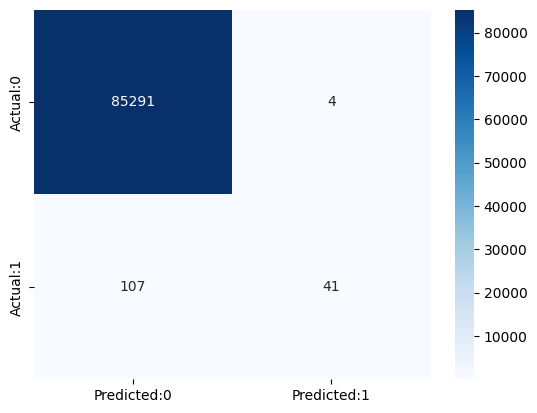

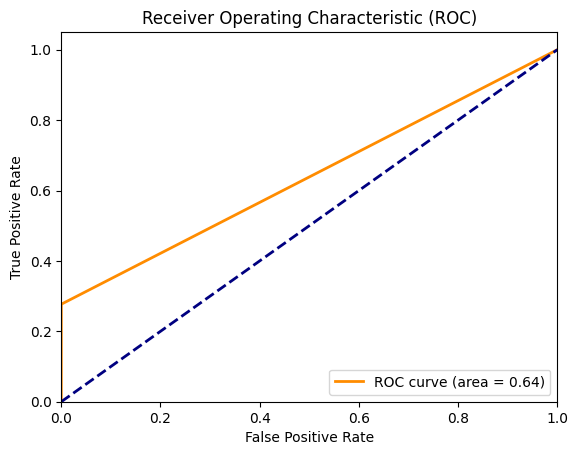

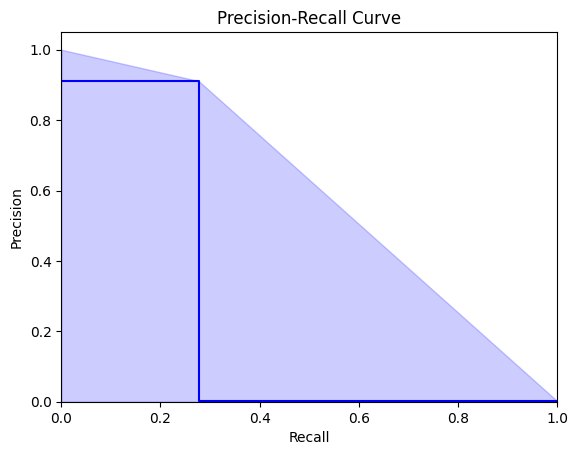

In [43]:
confusionlabeled_matrix = pd.DataFrame(data=confusion_matrix(y_test,y_pred), index=['Actual:0','Actual:1'],columns=['Predicted:0','Predicted:1'])
sns.heatmap(confusionlabeled_matrix,annot=True,fmt='d',cmap='Blues')
confusionlabeled_matrix
fpr, tpr, _ = roc_curve(y_test, y_pred)
roc_auc = auc(fpr, tpr)
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')
plt.show()

precision, recall, _ = precision_recall_curve(y_test, y_pred)

plt.figure()
plt.step(recall, precision, color='b', where='post')
plt.fill_between(recall, precision, alpha=0.2, color='b')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.title('Precision-Recall Curve')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.show()

**LOADING EVERY MODEL AND COMPARING ALL**

In [46]:
#train test split
X_train,X_test,y_train,y_test = train_test_split(rescaled_df,y,test_size=0.3,stratify=y)

In [43]:
svm_rbf = pickle.load(open('randomsearchRBFsvm.sav','rb'))
svm_rbf = svm_rbf.best_estimator_
svm_linear = pickle.load(open('randomsearchLINEARsvm.sav','rb'))
svm_linear = svm_linear.best_estimator_
svm_poly = pickle.load(open('randomsearchPOLYsvm.sav','rb'))
svm_poly = svm_poly.best_estimator_
tree_clf = pickle.load(open('randomsearchTREE.sav','rb'))
tree_clf = tree_clf.best_estimator_
randomforestclf = pickle.load(open('randomforestRScv.sav','rb'))
randomforestclf = randomforestclf.best_estimator_
bayes_clf = pickle.load(open('naivebayesclf.sav','rb'))
sgd_clf = pickle.load(open('randomsearchSGD.sav','rb'))
sgd_clf=sgd_clf.best_estimator_

c:\Users\HP\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:348: InconsistentVersionWarning: Trying to unpickle estimator SVC from version 1.2.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
c:\Users\HP\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\base.py:348: InconsistentVersionWarning: Trying to unpickle estimator RandomizedSearchCV from version 1.2.2 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


In [47]:
#calculate roc_auc score of each and save to a dataframe
roc_auc_scores = pd.DataFrame(columns=['Model','ROC_AUC'])
roc_auc_scores.loc[0] = ['svm_rbf',roc_auc_score(y_test,svm_rbf.predict(X_test))]
roc_auc_scores.loc[1] = ['svm_linear',roc_auc_score(y_test,svm_linear.predict(X_test))]
roc_auc_scores.loc[2] = ['svm_poly',roc_auc_score(y_test,svm_poly.predict(X_test))]
roc_auc_scores.loc[3] = ['tree_clf',roc_auc_score(y_test,tree_clf.predict(X_test))]
roc_auc_scores.loc[4] = ['randomforestclf',roc_auc_score(y_test,randomforestclf.predict(X_test))]
roc_auc_scores.loc[5] = ['bayes_clf',roc_auc_score(y_test,bayes_clf.predict(X_test))]
roc_auc_scores.loc[6] = ['sgd_clf',roc_auc_score(y_test,sgd_clf.predict(X_test))]
roc_auc_scores


,Model,ROC_AUC
0,svm_rbf,0.500000
1,svm_linear,0.898520
2,svm_poly,0.841199
3,tree_clf,0.901857
4,randomforestclf,0.949318
5,bayes_clf,0.898144
6,sgd_clf,0.675623


Confusion matrices:


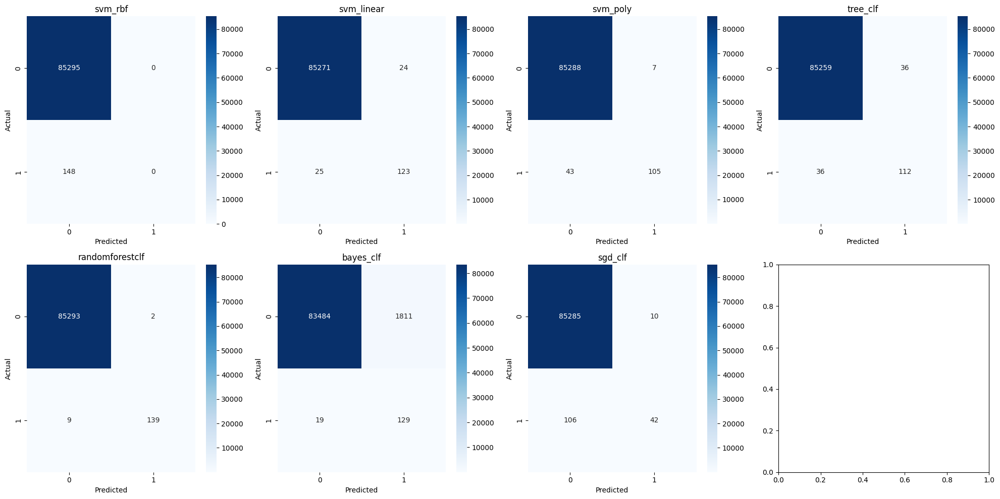

In [54]:
#confusion matrix for each model
confusion_matrices = []
confusion_matrices.append(confusion_matrix(y_test,svm_rbf.predict(X_test)))
confusion_matrices.append(confusion_matrix(y_test,svm_linear.predict(X_test)))
confusion_matrices.append(confusion_matrix(y_test,svm_poly.predict(X_test)))
confusion_matrices.append(confusion_matrix(y_test,tree_clf.predict(X_test)))
confusion_matrices.append(confusion_matrix(y_test,randomforestclf.predict(X_test)))
confusion_matrices.append(confusion_matrix(y_test,bayes_clf.predict(X_test)))
confusion_matrices.append(confusion_matrix(y_test,sgd_clf.predict(X_test)))
print("Confusion matrices:")
#plot confusion matrix for each
fig, axes = plt.subplots(2, 4, figsize=(20, 10))
axes = axes.flatten()
for i in range(len(confusion_matrices)):
    sns.heatmap(confusion_matrices[i], annot=True, fmt='d', cmap='Blues', ax=axes[i],linecolor='black')
    axes[i].set_title(roc_auc_scores['Model'][i])
    axes[i].set_xlabel('Predicted')
    axes[i].set_ylabel('Actual')
plt.tight_layout()
plt.show()
    

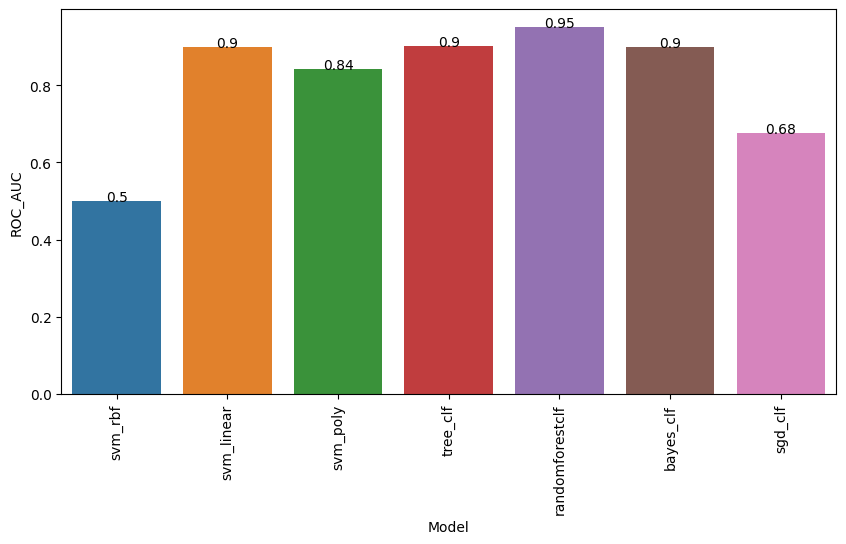

In [48]:
#make a bar chart to show the highest values of roc_auc with values also printed
plt.figure(figsize=(10,5))
sns.barplot(x='Model',y='ROC_AUC',data=roc_auc_scores)
plt.xticks(rotation=90)
for i in range(len(roc_auc_scores)):
    plt.text(i,roc_auc_scores['ROC_AUC'][i],round(roc_auc_scores['ROC_AUC'][i],2),ha='center')
plt.show()


As we can see random_forest_clf works best for this imbalanced class